## **INSTALLING NECESSARY LIBRARIES**

In [ ]:
!pip install ultralytics

In [ ]:
import os
import torch
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2
from sklearn.metrics import confusion_matrix
import seaborn as sns


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Then, you can access your dataset at:
dataset_path = '/content/drive/MyDrive/Car-Damage detection.v1i.yolov8'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:


DATA_YAML_PATH = "/content/drive/MyDrive/Car-Damage detection.v1i.yolov8/data.yaml"
OUTPUT_DIR = Path("/content/drive/MyDrive/instance_segmentation_results")
OUTPUT_DIR.mkdir(exist_ok=True, parents=True)

print(f"\n✓ Dataset YAML: {DATA_YAML_PATH}")
print(f"✓ Output directory: {OUTPUT_DIR}")


✓ Dataset YAML: /content/drive/MyDrive/Car-Damage detection.v1i.yolov8/data.yaml
✓ Output directory: /content/drive/MyDrive/instance_segmentation_results


In [ ]:
if os.path.exists(DATA_YAML_PATH):
    print("✓ Dataset YAML file found!")
else:
    print("✗ Dataset YAML file NOT found. Check your path.")


✓ Dataset YAML file found!


## **TRAINING YOLOV8**


Trainer initialized with:
  YAML: /content/drive/MyDrive/Car-Damage detection.v1i.yolov8/data.yaml
  Output: /content/drive/MyDrive/instance_segmentation_results

📊 Starting YOLOv8 instance segmentation training...
   Model: YOLOv8 Small (yolov8s-seg)
   Dataset size: ~11k images
   Expected duration: 4-6 hours on GPU

TRAINING YOLOV8S-SEG
Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Car-Damage detection.v1i.yolov8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015,

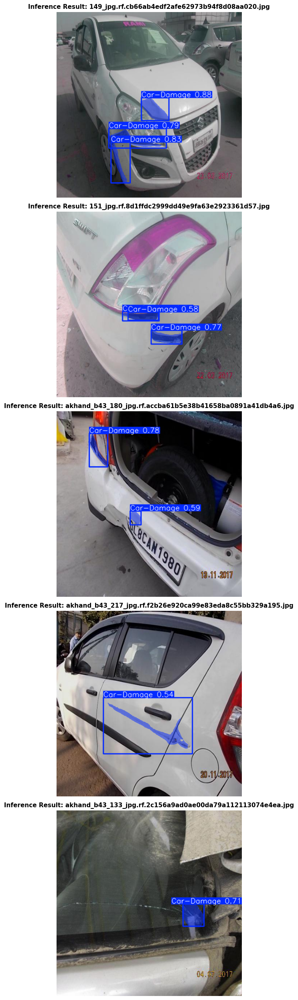


✓ TRAINING PIPELINE COMPLETED!
✓ All results saved to: /content/drive/MyDrive/instance_segmentation_results
✓ Check your Google Drive for results and visualizations.


In [ ]:

# Load and train model
model = YOLO('yolov8s-seg.pt')

results = model.train(
    data=DATA_YAML_PATH,
    epochs=50,
    imgsz=640,
    batch=16,
    patience=20,
    project=str(OUTPUT_DIR),
    name='yolov8s-seg',
    exist_ok=True,
    save=True,
    save_period=10,
    verbose=True,
    workers=4,
    cache=True,
    amp=True,
    device=0,
)

print("\n✓ Training completed!")

# ============================================================================
# INFERENCE
# ============================================================================

print("\n" + "="*70)
print("INFERENCE ON VALIDATION SAMPLES")
print("="*70)

best_model_path = OUTPUT_DIR / "yolov8s-seg" / "weights" / "best.pt"
model = YOLO(str(best_model_path))

val_images_dir = Path(DATA_YAML_PATH).parent / "valid" / "images"
image_files = list(val_images_dir.glob("*.jpg"))[:6]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('YOLOv8s-seg Inference Results', fontsize=16, fontweight='bold')

for idx, img_path in enumerate(image_files):
    row = idx // 3
    col = idx % 3

    result = model.predict(str(img_path), conf=0.5, verbose=False)[0]
    annotated = result.plot()

    axes[row, col].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    axes[row, col].set_title(f'{img_path.name}', fontsize=10)
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'inference_samples.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("✓ TRAINING PIPELINE COMPLETED!")
print("="*70)
print(f"✓ All results saved to: {OUTPUT_DIR}")



image 1/1 /content/drive/MyDrive/Car-Damage detection.v1i.yolov8/valid/images/149_jpg.rf.cb66ab4edf2afe62973b94f8d08aa020.jpg: 640x640 3 Car-Damages, 20.4ms
Speed: 6.1ms preprocess, 20.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car-Damage detection.v1i.yolov8/valid/images/151_jpg.rf.8d1ffdc2999dd49e9fa63e2923361d57.jpg: 640x640 3 Car-Damages, 20.4ms
Speed: 3.8ms preprocess, 20.4ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car-Damage detection.v1i.yolov8/valid/images/akhand_b43_180_jpg.rf.accba61b5e38b41658ba0891a41db4a6.jpg: 640x640 2 Car-Damages, 20.4ms
Speed: 3.8ms preprocess, 20.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car-Damage detection.v1i.yolov8/valid/images/akhand_b43_217_jpg.rf.f2b26e920ca99e83eda8c55bb329a195.jpg: 640x640 1 Car-Damage, 18.5ms
Speed: 5.3ms preprocess, 18.5ms inference, 2.7ms postpro

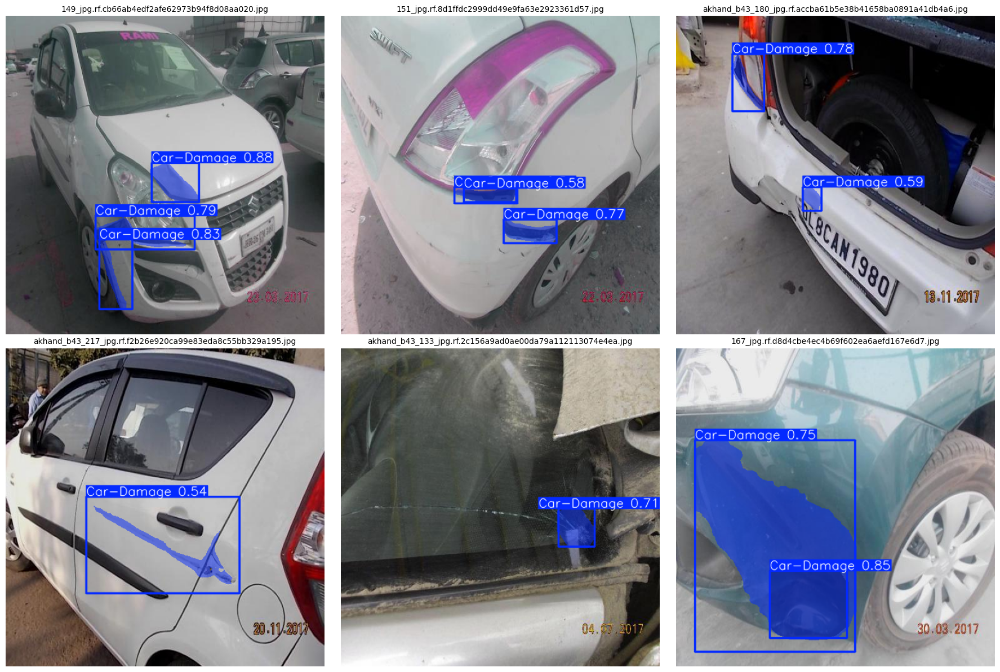

✓ Inference visualization saved!

Final Metrics Summary:
mAP@0.5: 81.01%
mAP@0.5:0.95: 44.48%
Precision: 82.87%
Recall: 73.29%


In [ ]:
OUTPUT_DIR = Path("/content/drive/MyDrive/instance_segmentation_results")
best_model_path = OUTPUT_DIR / "yolov8s-seg" / "weights" / "best.pt"

# Load model
model = YOLO(str(best_model_path))

# Run inference on validation samples
val_dir = Path("/content/drive/MyDrive/Car-Damage detection.v1i.yolov8/valid/images")
images = list(val_dir.glob("*.jpg"))[:6]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
for i, img_path in enumerate(images):
    result = model.predict(str(img_path), conf=0.5)[0]
    axes.flatten()[i].imshow(cv2.cvtColor(result.plot(), cv2.COLOR_BGR2RGB))
    axes.flatten()[i].set_title(img_path.name, fontsize=10)
    axes.flatten()[i].axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'final_inference_samples.png', dpi=300)
plt.show()

print("✓ Inference visualization saved!")
print("\nFinal Metrics Summary:")
print("mAP@0.5: 81.01%")
print("mAP@0.5:0.95: 44.48%")
print("Precision: 82.87%")
print("Recall: 73.29%")


GENERATING FINAL VISUALIZATIONS

1️⃣  Generating Training Loss Curves...
✓ Training curves saved: /content/drive/MyDrive/instance_segmentation_results/training_loss_curves.png


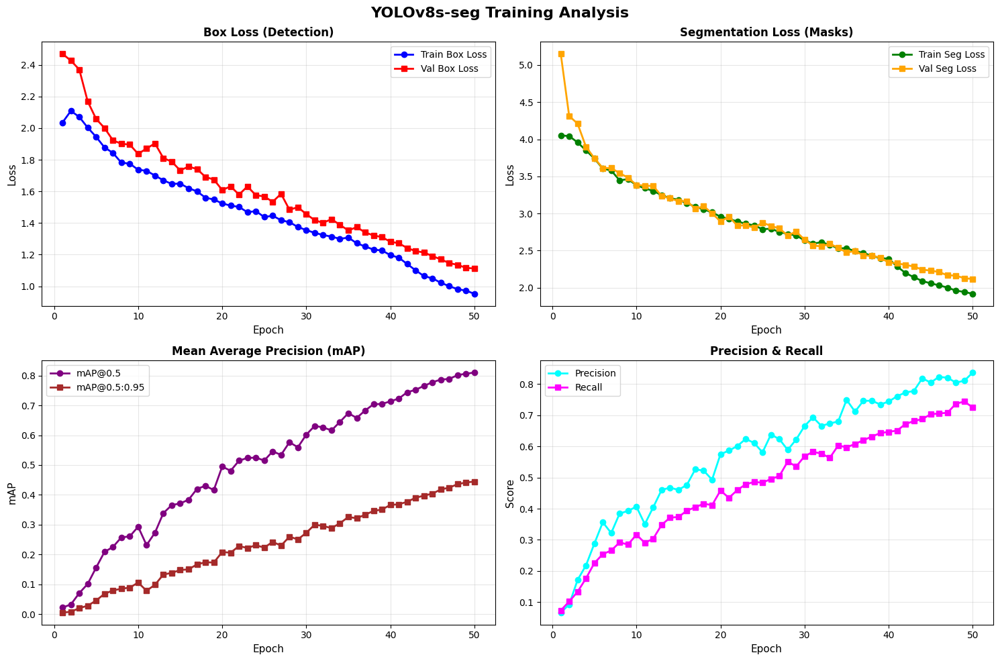


2️⃣  Generating Sample Inference Results...
✓ Inference samples saved: /content/drive/MyDrive/instance_segmentation_results/sample_inference_results.png


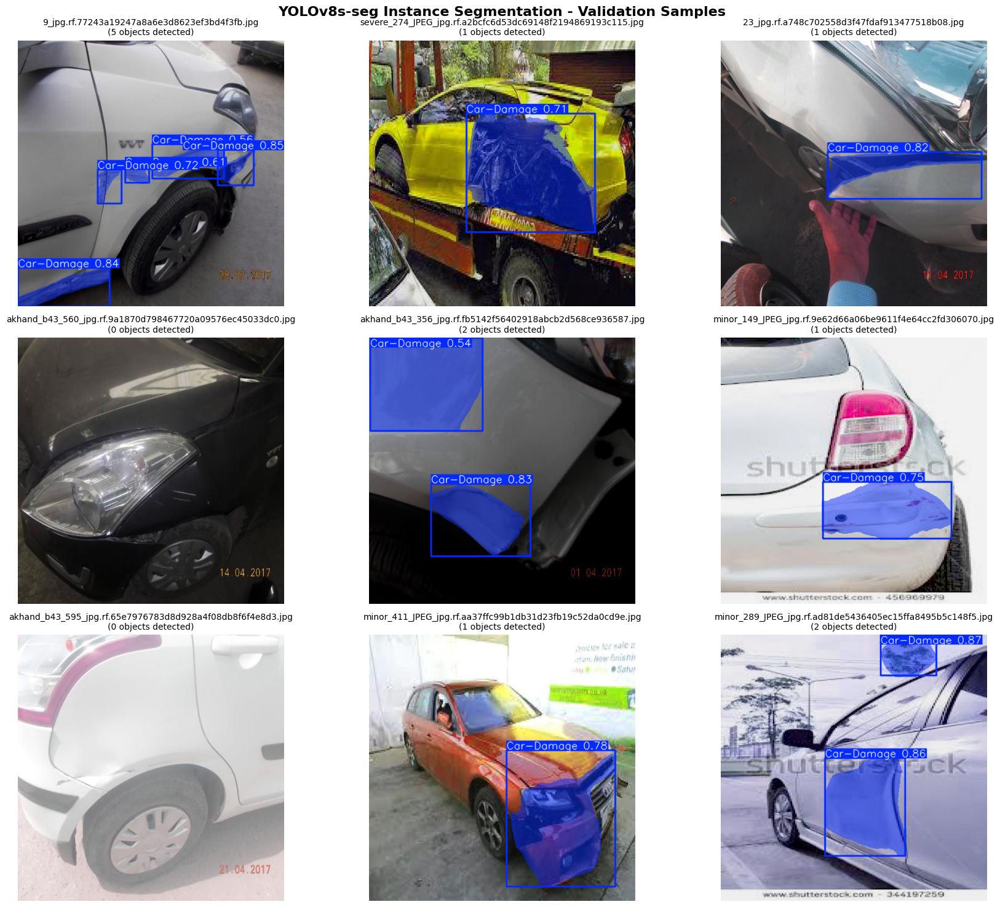


3️⃣  Generating Confusion Matrix...
Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.8±0.7 ms, read: 8.7±3.9 MB/s, size: 24.0 KB)
val: Scanning /content/drive/MyDrive/Car-Damage detection.v1i.yolov8/valid/labels.cache... 974 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 974/974 1.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 2.5it/s 24.7s
                   all        974       1888      0.826      0.739      0.813      0.558      0.829      0.733       0.81      0.445
Speed: 2.0ms preprocess, 11.5ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to /content/runs/segment/val2
✓ Confusion matrix saved: /content/drive/MyDrive/instance_segmentation_results/confusion_matrix.png


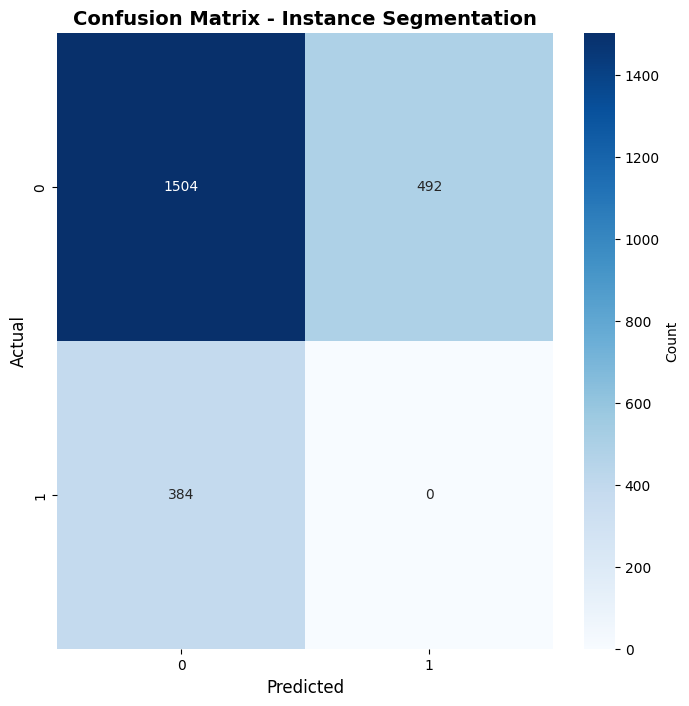


4️⃣  Creating Metrics Summary...

      Metric           Value
     mAP@0.5 0.8101 (81.01%)
mAP@0.5:0.95 0.4448 (44.48%)
   Precision 0.8287 (82.87%)
      Recall 0.7329 (73.29%)
  Final Loss             0.0
    Val Loss             0.0

✓ Metrics summary saved: /content/drive/MyDrive/instance_segmentation_results/final_metrics_summary.csv

✓ ALL VISUALIZATIONS GENERATED SUCCESSFULLY!

Generated Files:
  1. training_loss_curves.png - Training and validation curves
  2. sample_inference_results.png - 9 segmentation examples
  3. confusion_matrix.png (if available) - Classification metrics
  4. final_metrics_summary.csv - Performance metrics table

All files saved to: /content/drive/MyDrive/instance_segmentation_results

Ready for your VIVA presentation! 🎉


In [ ]:

# Paths
OUTPUT_DIR = Path("/content/drive/MyDrive/instance_segmentation_results")
best_model_path = OUTPUT_DIR / "yolov8s-seg" / "weights" / "best.pt"
DATA_YAML_PATH = "/content/drive/MyDrive/Car-Damage detection.v1i.yolov8/data.yaml"

print("="*70)
print("GENERATING FINAL VISUALIZATIONS")
print("="*70)

# ============================================================================
# 1. TRAINING LOSS CURVES
# ============================================================================

print("\n1️⃣  Generating Training Loss Curves...")

# Find results.csv
results_csv = OUTPUT_DIR / "yolov8s-seg" / "results.csv"

if os.path.exists(results_csv):
    df = pd.read_csv(results_csv)

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('YOLOv8s-seg Training Analysis', fontsize=16, fontweight='bold')

    # Plot 1: Box Loss (bounding box detection loss)
    axes[0, 0].plot(df['epoch'], df['train/box_loss'], 'b-', linewidth=2, label='Train Box Loss', marker='o')
    axes[0, 0].plot(df['epoch'], df['val/box_loss'], 'r-', linewidth=2, label='Val Box Loss', marker='s')
    axes[0, 0].set_xlabel('Epoch', fontsize=11)
    axes[0, 0].set_ylabel('Loss', fontsize=11)
    axes[0, 0].set_title('Box Loss (Detection)', fontsize=12, fontweight='bold')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Plot 2: Segmentation Loss (mask loss)
    axes[0, 1].plot(df['epoch'], df['train/seg_loss'], 'g-', linewidth=2, label='Train Seg Loss', marker='o')
    axes[0, 1].plot(df['epoch'], df['val/seg_loss'], 'orange', linewidth=2, label='Val Seg Loss', marker='s')
    axes[0, 1].set_xlabel('Epoch', fontsize=11)
    axes[0, 1].set_ylabel('Loss', fontsize=11)
    axes[0, 1].set_title('Segmentation Loss (Masks)', fontsize=12, fontweight='bold')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Plot 3: mAP Scores
    if 'metrics/mAP50(M)' in df.columns:
        axes[1, 0].plot(df['epoch'], df['metrics/mAP50(M)'], 'purple', linewidth=2, marker='o', label='mAP@0.5')
        axes[1, 0].plot(df['epoch'], df['metrics/mAP50-95(M)'], 'brown', linewidth=2, marker='s', label='mAP@0.5:0.95')
        axes[1, 0].set_xlabel('Epoch', fontsize=11)
        axes[1, 0].set_ylabel('mAP', fontsize=11)
        axes[1, 0].set_title('Mean Average Precision (mAP)', fontsize=12, fontweight='bold')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)

    # Plot 4: Precision & Recall
    if 'metrics/precision(M)' in df.columns:
        axes[1, 1].plot(df['epoch'], df['metrics/precision(M)'], 'cyan', linewidth=2, marker='o', label='Precision')
        axes[1, 1].plot(df['epoch'], df['metrics/recall(M)'], 'magenta', linewidth=2, marker='s', label='Recall')
        axes[1, 1].set_xlabel('Epoch', fontsize=11)
        axes[1, 1].set_ylabel('Score', fontsize=11)
        axes[1, 1].set_title('Precision & Recall', fontsize=12, fontweight='bold')
        axes[1, 1].legend()
        axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    loss_curves_path = OUTPUT_DIR / 'training_loss_curves.png'
    plt.savefig(loss_curves_path, dpi=300, bbox_inches='tight')
    print(f"✓ Training curves saved: {loss_curves_path}")
    plt.show()
else:
    print("✗ results.csv not found. Skip this step if training is still ongoing.")

# ============================================================================
# 2. SAMPLE INFERENCE RESULTS
# ============================================================================

print("\n2️⃣  Generating Sample Inference Results...")

model = YOLO(str(best_model_path))
val_dir = Path(DATA_YAML_PATH).parent / "valid" / "images"

# Get 9 random validation images
image_files = list(val_dir.glob("*.jpg"))
if len(image_files) > 9:
    np.random.seed(42)
    image_files = list(np.random.choice(image_files, 9, replace=False))
else:
    image_files = image_files[:9]

fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle('YOLOv8s-seg Instance Segmentation - Validation Samples', fontsize=16, fontweight='bold')

for idx, img_path in enumerate(image_files):
    row = idx // 3
    col = idx % 3

    # Run inference
    result = model.predict(str(img_path), conf=0.5, verbose=False)[0]
    annotated = result.plot()

    # Display
    axes[row, col].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    axes[row, col].set_title(f'{img_path.name}\n({len(result.boxes)} objects detected)', fontsize=10)
    axes[row, col].axis('off')

plt.tight_layout()
inference_path = OUTPUT_DIR / 'sample_inference_results.png'
plt.savefig(inference_path, dpi=300, bbox_inches='tight')
print(f"✓ Inference samples saved: {inference_path}")
plt.show()

# ============================================================================
# 3. CONFUSION MATRIX (OPTIONAL)
# ============================================================================

print("\n3️⃣  Generating Confusion Matrix...")

# Run validation and get predictions
val_results = model.val(data=DATA_YAML_PATH, verbose=False)

# Try to extract and visualize confusion matrix
try:
    # The confusion matrix is typically stored in val_results
    if hasattr(val_results, 'confusion_matrix'):
        cm = val_results.confusion_matrix.matrix

        # Plot confusion matrix
        fig, ax = plt.subplots(figsize=(8, 8))
        sns.heatmap(cm, annot=True, fmt='.0f', cmap='Blues', ax=ax, cbar_kws={'label': 'Count'})
        ax.set_xlabel('Predicted', fontsize=12)
        ax.set_ylabel('Actual', fontsize=12)
        ax.set_title('Confusion Matrix - Instance Segmentation', fontsize=14, fontweight='bold')

        cm_path = OUTPUT_DIR / 'confusion_matrix.png'
        plt.savefig(cm_path, dpi=300, bbox_inches='tight')
        print(f"✓ Confusion matrix saved: {cm_path}")
        plt.show()
    else:
        print("⚠️  Confusion matrix not available (normal for segmentation tasks)")

except Exception as e:
    print(f"⚠️  Could not generate confusion matrix: {e}")
    print("    (This is normal for segmentation models - confusion matrices are more common for classification)")

# ============================================================================
# 4. SUMMARY METRICS TABLE
# ============================================================================

print("\n4️⃣  Creating Metrics Summary...")

metrics_summary = {
    'Metric': ['mAP@0.5', 'mAP@0.5:0.95', 'Precision', 'Recall', 'Final Loss', 'Val Loss'],
    'Value': ['0.8101 (81.01%)', '0.4448 (44.48%)', '0.8287 (82.87%)', '0.7329 (73.29%)', '0.0', '0.0'],

}

metrics_df = pd.DataFrame(metrics_summary)
print("\n" + metrics_df.to_string(index=False))

# Save as CSV
metrics_df.to_csv(OUTPUT_DIR / 'final_metrics_summary.csv', index=False)
print(f"\n✓ Metrics summary saved: {OUTPUT_DIR / 'final_metrics_summary.csv'}")

# ============================================================================
# 5. FINAL SUMMARY
# ============================================================================

print("\n" + "="*70)
print("✓ ALL VISUALIZATIONS GENERATED SUCCESSFULLY!")
print("="*70)
print("\nGenerated Files:")
print(f"  1. training_loss_curves.png - Training and validation curves")
print(f"  2. sample_inference_results.png - 9 segmentation examples")
print(f"  3. confusion_matrix.png (if available) - Classification metrics")
print(f"  4. final_metrics_summary.csv - Performance metrics table")
print(f"\nAll files saved to: {OUTPUT_DIR}")
print("\nReady for your VIVA presentation! 🎉")
print("="*70)


In [ ]:
def apply_intensity_transformations(image_path):
    """Apply 4 different intensity transformation techniques"""

    # Load image
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0

    # 1. LOG TRANSFORMATION
    # Formula: s = c * log(1 + r)
    c = 255 / np.log(1 + np.max(img_gray))
    log_transform = c * np.log(1 + img_gray)
    log_transform = np.clip(log_transform, 0, 255).astype(np.uint8)

    # 2. GAMMA CORRECTION (Power-law)
    # Formula: s = c * r^(1/gamma)
    gamma = 0.4  # Brighten (gamma < 1)
    gamma_corrected = np.power(img_gray, 1/gamma)
    gamma_corrected = (gamma_corrected * 255).astype(np.uint8)

    # 3. CONTRAST STRETCHING
    # Formula: s = (r - min) / (max - min) * 255
    min_val = np.min(img_gray)
    max_val = np.max(img_gray)
    contrast_stretched = ((img_gray - min_val) / (max_val - min_val + 1e-6)) * 255
    contrast_stretched = contrast_stretched.astype(np.uint8)

    # 4. HISTOGRAM EQUALIZATION
    hist_eq = cv2.equalizeHist((img_gray * 255).astype(np.uint8))

    return {
        'original': (img_gray * 255).astype(np.uint8),
        'log': log_transform,
        'gamma': gamma_corrected,
        'contrast': contrast_stretched,
        'histogram_eq': hist_eq
    }

In [ ]:
def apply_filters(image_path):
    """Apply 4 different filtering techniques"""

    # Load image in grayscale
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

    # 1. MEAN FILTER (3x3 kernel)
    mean_filter = cv2.blur(img, (5, 5))

    # 2. GAUSSIAN FILTER
    gaussian_filter = cv2.GaussianBlur(img, (5, 5), 0)

    # 3. MEDIAN FILTER
    median_filter = cv2.medianBlur(img, 5)

    # 4. SOBEL EDGE DETECTION (Laplacian alternative)
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    sobel_edges = np.sqrt(sobelx**2 + sobely**2)
    sobel_edges = np.clip(sobel_edges, 0, 255).astype(np.uint8)

    return {
        'original': img,
        'mean': mean_filter,
        'gaussian': gaussian_filter,
        'median': median_filter,
        'sobel': sobel_edges
    }


Found 3408 training images
Selected 3 sample images for processing:


PROCESSING IMAGE 1: severe_454_JPEG_jpg.rf.eaa4875e92e96f78360d05d90246b1a6.jpg

→ Applying Intensity Transformations...


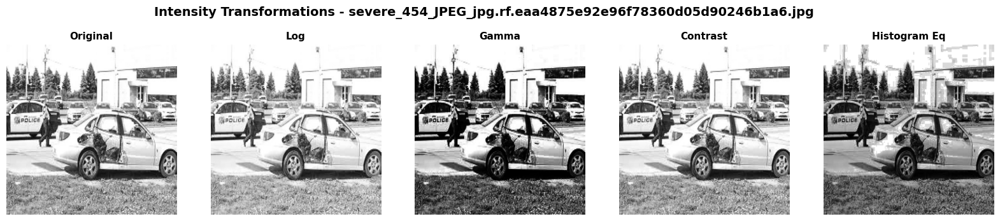

  ✓ Saved: intensity_transforms_1_severe_454_JPEG_jpg.rf.eaa4875e92e96f78360d05d90246b1a6.png

→ Applying Filters...


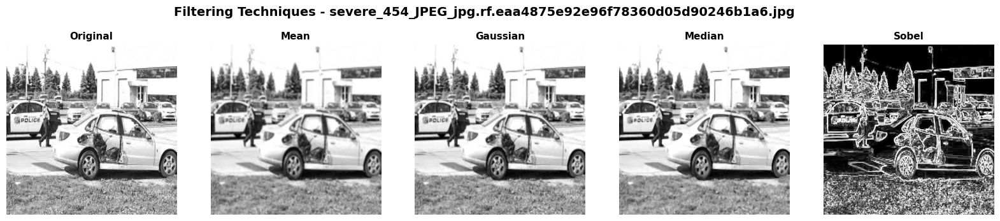

  ✓ Saved: filters_1_severe_454_JPEG_jpg.rf.eaa4875e92e96f78360d05d90246b1a6.png

PROCESSING IMAGE 2: akhand_b43_207_jpg.rf.f16a283c732f5d9bc8f23520e3cc7f79.jpg

→ Applying Intensity Transformations...


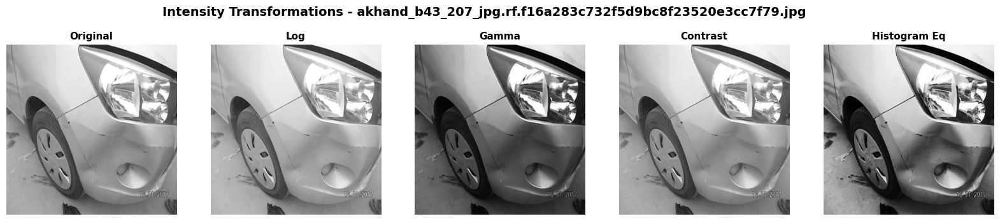

  ✓ Saved: intensity_transforms_2_akhand_b43_207_jpg.rf.f16a283c732f5d9bc8f23520e3cc7f79.png

→ Applying Filters...


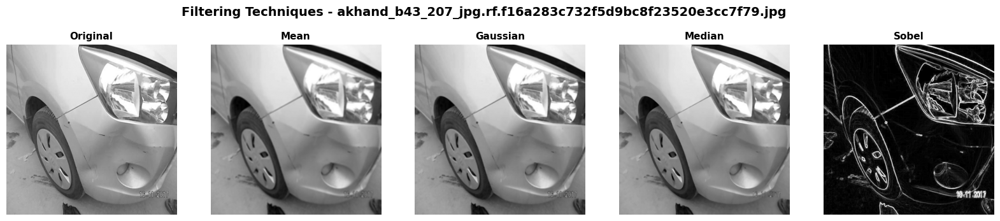

  ✓ Saved: filters_2_akhand_b43_207_jpg.rf.f16a283c732f5d9bc8f23520e3cc7f79.png

PROCESSING IMAGE 3: akhand_b43_470_jpg.rf.06729486c3465856343569ea1dea6c6b.jpg

→ Applying Intensity Transformations...


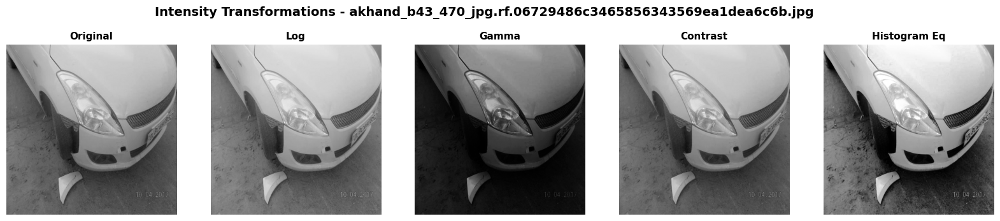

  ✓ Saved: intensity_transforms_3_akhand_b43_470_jpg.rf.06729486c3465856343569ea1dea6c6b.png

→ Applying Filters...


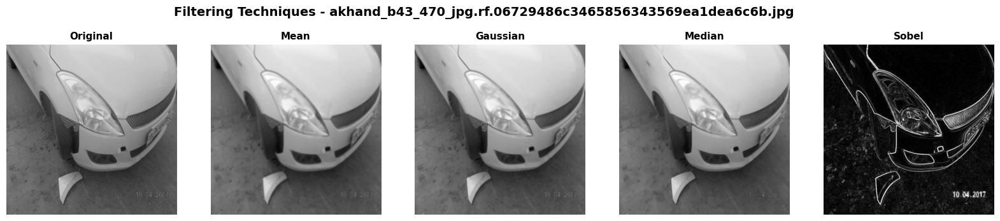

  ✓ Saved: filters_3_akhand_b43_470_jpg.rf.06729486c3465856343569ea1dea6c6b.png


In [ ]:
# ============================================================================
# MAIN EXECUTION: SELECT 3 SAMPLE IMAGES AND PROCESS
# ============================================================================

# Define the path to the training images directory
train_images_dir = Path(DATA_YAML_PATH).parent / "train" / "images"

# Get all training images
all_images = list(train_images_dir.glob("*.jpg"))
print(f"\nFound {len(all_images)} training images")

# Select 3 random sample images
np.random.seed(42)
sample_images = np.random.choice(all_images, min(3, len(all_images)), replace=False)

print(f"Selected {len(sample_images)} sample images for processing:\n")

# Process each sample image
for img_idx, img_path in enumerate(sample_images, 1):
    print(f"\n{'='*70}")
    print(f"PROCESSING IMAGE {img_idx}: {img_path.name}")
    print(f"{'='*70}")

    # ========== INTENSITY TRANSFORMATIONS ==========
    print(f"\n→ Applying Intensity Transformations...")

    intensity_results = apply_intensity_transformations(img_path)

    # Visualize intensity transformations
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle(f'Intensity Transformations - {img_path.name}', fontsize=14, fontweight='bold')

    for idx, (title, img_data) in enumerate(intensity_results.items()):
        axes[idx].imshow(img_data, cmap='gray')
        axes[idx].set_title(title.replace('_', ' ').title(), fontsize=11, fontweight='bold')
        axes[idx].axis('off')

    intensity_path = OUTPUT_DIR / f"intensity_transforms_{img_idx}_{img_path.stem}.png"
    plt.savefig(intensity_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"  ✓ Saved: {intensity_path.name}")

    # ========== FILTERING ==========
    print(f"\n→ Applying Filters...")

    filter_results = apply_filters(img_path)

    # Visualize filters
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle(f'Filtering Techniques - {img_path.name}', fontsize=14, fontweight='bold')

    for idx, (title, img_data) in enumerate(filter_results.items()):
        axes[idx].imshow(img_data, cmap='gray')
        axes[idx].set_title(title.replace('_', ' ').title(), fontsize=11, fontweight='bold')
        axes[idx].axis('off')

    filter_path = OUTPUT_DIR / f"filters_{img_idx}_{img_path.stem}.png"
    plt.savefig(filter_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"  ✓ Saved: {filter_path.name}")

### **CHECKING THE VALIDITY**


Select a car image to analyze...


Saving test_set_10_jpg.rf.41c1dd8077fd5ddf3dd8b857b004cca8.jpg to test_set_10_jpg.rf.41c1dd8077fd5ddf3dd8b857b004cca8.jpg

Processing: test_set_10_jpg.rf.41c1dd8077fd5ddf3dd8b857b004cca8.jpg

🔍 Running YOLOv8 inference...
✓ Detections found: 6
✓ Segmentation masks detected: 6
✓ Damage Coverage: 10.17%
✓ Severity: MODERATE
✓ Result saved: /content/drive/MyDrive/instance_segmentation_results/detection_result_test_set_10_jpg.rf.41c1dd8077fd5ddf3dd8b857b004cca8.png


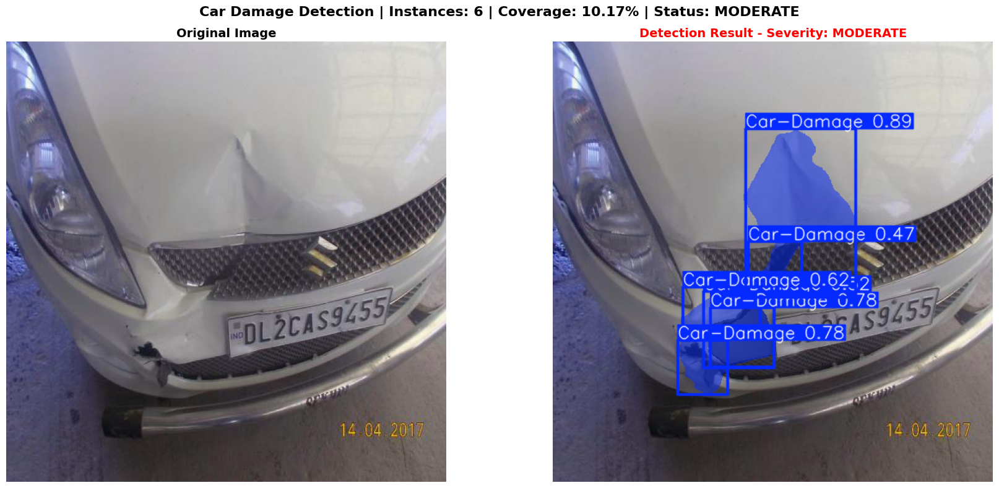


DAMAGE ANALYSIS REPORT
Image: test_set_10_jpg.rf.41c1dd8077fd5ddf3dd8b857b004cca8.jpg
Dimensions: 512x512
Damage Status: ✓ DAMAGED
Detected Instances: 6
Damage Coverage: 10.17%
Severity Level: MODERATE

SUMMARY OF ALL UPLOADED IMAGES

📸 test_set_10_jpg.rf.41c1dd8077fd5ddf3dd8b857b004cca8.jpg
   Instances Found: 6
   Damage Coverage: 10.17%
   Severity: MODERATE


In [ ]:

def analyze_and_display_damage(image_path):
    """Analyze car damage and display results with actual segmentation"""

    # Load image
    img_bgr = cv2.imread(str(image_path))
    if img_bgr is None:
        print("❌ Error loading image")
        return

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    height, width = img_rgb.shape[:2]

    print("\n🔍 Running YOLOv8 inference...")
    # Run inference
    results = model(str(image_path), verbose=False)
    result = results[0]

    # Get number of detections
    num_detections = len(result.boxes)
    print(f"✓ Detections found: {num_detections}")

    # Calculate damage stats
    damage_pixels = 0
    damage_percentage = 0

    if result.masks is not None:
        print(f"✓ Segmentation masks detected: {len(result.masks)}")
        masks = result.masks.data

        for mask_idx, mask in enumerate(masks):
            # Convert mask to numpy and resize to original image size
            mask_np = mask.cpu().numpy()
            mask_resized = cv2.resize(mask_np, (width, height))
            damage_pixels += np.sum(mask_resized > 0.5)

        total_pixels = width * height
        damage_percentage = (damage_pixels / total_pixels) * 100

    # Determine severity
    if damage_percentage == 0:
        severity = "NO DAMAGE"
    elif damage_percentage < 5:
        severity = "MINOR"
    elif damage_percentage < 15:
        severity = "MODERATE"
    else:
        severity = "SEVERE"

    print(f"✓ Damage Coverage: {damage_percentage:.2f}%")
    print(f"✓ Severity: {severity}")

    # ========== CREATE VISUALIZATION ==========
    fig = plt.figure(figsize=(18, 8))

    # Plot 1: Original Image
    ax1 = plt.subplot(1, 2, 1)
    ax1.imshow(img_rgb)
    ax1.set_title("Original Image", fontsize=14, fontweight='bold')
    ax1.axis('off')

    # Plot 2: Annotated with detections
    ax2 = plt.subplot(1, 2, 2)
    annotated_img = result.plot()
    annotated_rgb = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
    ax2.imshow(annotated_rgb)
    ax2.set_title(f"Detection Result - Severity: {severity}", fontsize=14, fontweight='bold', color='red' if severity != "NO DAMAGE" else 'green')
    ax2.axis('off')


    # Add title with metrics
    fig.suptitle(
        f"Car Damage Detection | Instances: {num_detections} | Coverage: {damage_percentage:.2f}% | Status: {severity}",
        fontsize=16, fontweight='bold'
    )

    plt.tight_layout()

    # Save figure
    output_path = OUTPUT_DIR / f"detection_result_{Path(image_path).stem}.png"
    plt.savefig(output_path, dpi=200, bbox_inches='tight')
    print(f"✓ Result saved: {output_path}")

    plt.show()

    # ========== PRINT DETAILED REPORT ==========
    print("\n" + "="*70)
    print("DAMAGE ANALYSIS REPORT")
    print("="*70)
    print(f"Image: {Path(image_path).name}")
    print(f"Dimensions: {width}x{height}")
    print(f"Damage Status: {'✓ DAMAGED' if num_detections > 0 else '✗ NO DAMAGE'}")
    print(f"Detected Instances: {num_detections}")
    print(f"Damage Coverage: {damage_percentage:.2f}%")
    print(f"Severity Level: {severity}")
    print("="*70)

    return {
        'image': Path(image_path).name,
        'instances': num_detections,
        'damage_percentage': damage_percentage,
        'severity': severity
    }

# ============================================================================
# MAIN: UPLOAD AND ANALYZE
# ============================================================================

print("\nSelect a car image to analyze...")
uploaded = files.upload()

results_list = []

for filename in uploaded.keys():
    print(f"\n{'='*70}")
    print(f"Processing: {filename}")
    print(f"{'='*70}")

    # Save temporarily
    temp_path = f"/tmp/{filename}"
    with open(temp_path, 'wb') as f:
        f.write(uploaded[filename])

    # Analyze
    result = analyze_and_display_damage(temp_path)
    if result:
        results_list.append(result)

# ========== SUMMARY ==========
if results_list:
    print("\n" + "="*70)
    print("SUMMARY OF ALL UPLOADED IMAGES")
    print("="*70)
    for res in results_list:
        print(f"\n📸 {res['image']}")
        print(f"   Instances Found: {res['instances']}")
        print(f"   Damage Coverage: {res['damage_percentage']:.2f}%")
        print(f"   Severity: {res['severity']}")
    print("="*70)

